In [2]:
# STEP 1A: Load the CSVs into DataFrames
import pandas as pd

df_life = pd.read_csv("life_expectancy.csv")
df_fert = pd.read_csv("fertility_rate.csv")
df_pop  = pd.read_csv("country_population.csv")
df_meta = pd.read_csv("Metadata_Country.csv")

print("Loaded shapes:")
print({
    "life_expectancy": df_life.shape,
    "fertility_rate": df_fert.shape,
    "country_population": df_pop.shape,
    "metadata_country": df_meta.shape,
})

Loaded shapes:
{'life_expectancy': (264, 61), 'fertility_rate': (264, 61), 'country_population': (264, 61), 'metadata_country': (263, 6)}


In [3]:
# STEP 1B: Helper to detect year columns (wide format, e.g., 1960...2020)
def detect_year_columns(df, year_min=1900, year_max=2100):
    year_cols = []
    for col in df.columns:
        col_str = str(col).strip()
        if col_str.isdigit():
            year = int(col_str)
            if year_min <= year <= year_max:
                year_cols.append(col)
    return year_cols

# Collect quick summaries for each dataset
def summarize_dataset(name, df):
    year_cols = detect_year_columns(df)
    non_year_cols = [c for c in df.columns if c not in year_cols]
    likely_keys = [c for c in non_year_cols if c.lower() in {
        "country name", "country code", "indicator name", "indicator code", "region", "income group"
    }]

    year_min = int(min(year_cols)) if year_cols else None
    year_max = int(max(year_cols)) if year_cols else None
    nans_in_years = int(df[year_cols].isna().sum().sum()) if year_cols else 0

    return {
        "dataset": name,
        "shape": f"{df.shape[0]} x {df.shape[1]}",
        "years (min→max)": f"{year_min} → {year_max}" if year_min is not None else "—",
        "# year cols": len(year_cols),
        "NaNs in year values": nans_in_years,
        "likely key cols": ", ".join(likely_keys) if likely_keys else "—",
        "example non-year cols": ", ".join(non_year_cols[:8]) if non_year_cols else "—",
    }

report = pd.DataFrame([
    summarize_dataset("life_expectancy", df_life),
    summarize_dataset("fertility_rate", df_fert),
    summarize_dataset("country_population", df_pop),
    summarize_dataset("metadata_country", df_meta),
])

report

,dataset,shape,years (min→max),# year cols,NaNs in year values,likely key cols,example non-year cols
0,life_expectancy,264 x 61,1960 → 2016,57,1301,"Country Name, Country Code, Indicator Name, In...","Country Name, Country Code, Indicator Name, In..."
1,fertility_rate,264 x 61,1960 → 2016,57,1278,"Country Name, Country Code, Indicator Name, In...","Country Name, Country Code, Indicator Name, In..."
2,country_population,264 x 61,1960 → 2016,57,163,"Country Name, Country Code, Indicator Name, In...","Country Name, Country Code, Indicator Name, In..."
3,metadata_country,263 x 6,—,0,0,"Country Code, Region","Country Code, Region, IncomeGroup, SpecialNote..."


In [4]:
# STEP 1C: Preview the first 10 rows of each dataset
print("life_expectancy — head(10)")
display(df_life.head(10))

print("fertility_rate — head(10)")
display(df_fert.head(10))

print("country_population — head(10)")
display(df_pop.head(10))

print("metadata_country — head(10)")
display(df_meta.head(10))

life_expectancy — head(10)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.662000,66.074000,66.444000,66.787000,67.113000,67.435000,...,74.576000,74.72500,74.872000,75.016000,75.158000,75.299000,75.440000,75.582000,75.725000,75.867000
1,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.292000,32.742000,33.185000,33.624000,34.060000,34.495000,...,59.694000,60.24300,60.754000,61.226000,61.666000,62.086000,62.494000,62.895000,63.288000,63.673000
2,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,33.251000,33.573000,33.914000,34.272000,34.645000,35.031000,...,55.096000,56.18900,57.231000,58.192000,59.042000,59.770000,60.373000,60.858000,61.241000,61.547000
3,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,62.279000,63.298000,64.187000,64.911000,65.461000,65.848000,...,75.656000,75.94300,76.281000,76.652000,77.031000,77.389000,77.702000,77.963000,78.174000,78.345000
4,Andorra,AND,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Arab World,ARB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,46.825065,47.407699,47.988878,48.572229,49.159167,49.744338,...,69.424552,69.64697,69.851434,70.041054,70.223894,70.408016,70.598298,70.793957,70.994541,71.198456
6,United Arab Emirates,ARE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,52.265000,53.312000,54.349000,55.375000,56.385000,57.374000,...,75.828000,76.01200,76.183000,76.344000,76.498000,76.648000,76.798000,76.948000,77.101000,77.256000
7,Argentina,ARG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.022000,65.141000,65.233000,65.311000,65.388000,65.481000,...,75.105000,75.26800,75.431000,75.595000,75.761000,75.926000,76.089000,76.252000,76.415000,76.577000
8,Armenia,ARM,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.971000,66.402000,66.837000,67.276000,67.715000,68.152000,...,72.815000,72.94600,73.119000,73.331000,73.571000,73.814000,74.044000,74.255000,74.445000,74.618000
9,American Samoa,ASM,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


fertility_rate — head(10)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,4.820000,4.65500,4.47100,4.271000,4.059000,3.842000,...,1.763000,1.764000,1.769000,1.776000,1.783000,1.791000,1.796000,1.800000,1.80100,1.800000
1,Afghanistan,AFG,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.450000,7.45000,7.45000,7.450000,7.450000,7.450000,...,6.460000,6.254000,6.038000,5.816000,5.595000,5.380000,5.174000,4.981000,4.80200,4.635000
2,Angola,AGO,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.478000,7.52400,7.56300,7.592000,7.611000,7.619000,...,6.368000,6.307000,6.238000,6.162000,6.082000,6.000000,5.920000,5.841000,5.76600,5.694000
3,Albania,ALB,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.489000,6.40100,6.28200,6.133000,5.960000,5.773000,...,1.668000,1.650000,1.646000,1.653000,1.668000,1.685000,1.700000,1.710000,1.71400,1.713000
4,Andorra,AND,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.180000,1.250000,1.190000,1.270000,NaN,NaN,NaN,NaN,NaN,NaN
5,Arab World,ARB,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.948747,6.97137,6.99235,7.009265,7.020105,7.023159,...,3.476805,3.470126,3.469736,3.471666,3.470003,3.461347,3.442829,3.413299,3.37384,3.326532
6,United Arab Emirates,ARE,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.929000,6.91000,6.89200,6.875000,6.857000,6.838000,...,2.005000,1.949000,1.904000,1.869000,1.841000,1.820000,1.801000,1.783000,1.76500,1.748000
7,Argentina,ARG,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,3.109000,3.10000,3.08900,3.078000,3.068000,3.058000,...,2.413000,2.396000,2.382000,2.370000,2.358000,2.347000,2.335000,2.322000,2.30800,2.293000
8,Armenia,ARM,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,4.786000,4.67000,4.52100,4.345000,4.150000,3.950000,...,1.702000,1.706000,1.703000,1.693000,1.680000,1.664000,1.648000,1.634000,1.62200,1.612000
9,American Samoa,ASM,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


country_population — head(10)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,"Population, total",SP.POP.TOTL,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,"Population, total",SP.POP.TOTL,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,"Population, total",SP.POP.TOTL,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0
5,Arab World,ARB,"Population, total",SP.POP.TOTL,92490932.0,95044497.0,97682294.0,100411076.0,103239902.0,106174988.0,...,331653797.0,339825483.0,348145094.0,356508908.0,364895878.0,373306993.0,381702086.0,390043028.0,398304960.0,406452690.0
6,United Arab Emirates,ARE,"Population, total",SP.POP.TOTL,92634.0,101078.0,112472.0,125566.0,138529.0,150362.0,...,6044067.0,6894278.0,7666393.0,8270684.0,8672475.0,8900453.0,9006263.0,9070867.0,9154302.0,9269612.0
7,Argentina,ARG,"Population, total",SP.POP.TOTL,20619075.0,20953077.0,21287682.0,21621840.0,21953929.0,22283390.0,...,39970224.0,40382389.0,40799407.0,41223889.0,41656879.0,42096739.0,42539925.0,42981515.0,43417765.0,43847430.0
8,Armenia,ARM,"Population, total",SP.POP.TOTL,1874120.0,1941491.0,2009526.0,2077575.0,2144998.0,2211316.0,...,2933056.0,2908220.0,2888584.0,2877311.0,2875581.0,2881922.0,2893509.0,2906220.0,2916950.0,2924816.0
9,American Samoa,ASM,"Population, total",SP.POP.TOTL,20013.0,20486.0,21117.0,21882.0,22698.0,23520.0,...,57903.0,57030.0,56227.0,55637.0,55320.0,55230.0,55307.0,55437.0,55537.0,55599.0


metadata_country — head(10)


,Country Code,Region,IncomeGroup,SpecialNotes,TableName,Unnamed: 5
0,ABW,Latin America & Caribbean,High income,SNA data for 2000-2011 are updated from offici...,Aruba,NaN
1,AFG,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
2,AGO,Sub-Saharan Africa,Lower middle income,NaN,Angola,NaN
3,ALB,Europe & Central Asia,Upper middle income,NaN,Albania,NaN
4,AND,Europe & Central Asia,High income,WB-3 code changed from ADO to AND to align wit...,Andorra,NaN
5,ARB,NaN,NaN,Arab World aggregate. Arab World is composed o...,Arab World,NaN
6,ARE,Middle East & North Africa,High income,NaN,United Arab Emirates,NaN
7,ARG,Latin America & Caribbean,Upper middle income,National Institute of Statistics and Census re...,Argentina,NaN
8,ARM,Europe & Central Asia,Lower middle income,NaN,Armenia,NaN
9,ASM,East Asia & Pacific,Upper middle income,New base Year 2009,American Samoa,NaN


In [5]:
# STEP 1D: Country alignment sanity check — unique counts for Country Name / Country Code
def unique_country_counts(df):
    # Try to find canonical columns (case-insensitive)
    cols = {c.lower(): c for c in df.columns}
    name_col = cols.get("country name")
    code_col = cols.get("country code")
    return {
        "unique country names": df[name_col].nunique() if name_col in df.columns else None,
        "unique country codes": df[code_col].nunique() if code_col in df.columns else None
    }

alignment = pd.DataFrame.from_dict({
    "life_expectancy": unique_country_counts(df_life),
    "fertility_rate": unique_country_counts(df_fert),
    "country_population": unique_country_counts(df_pop),
    "metadata_country": unique_country_counts(df_meta),
}, orient="index").reset_index().rename(columns={"index": "dataset"})

alignment

,dataset,unique country names,unique country codes
0,life_expectancy,264.0,264
1,fertility_rate,264.0,264
2,country_population,264.0,264
3,metadata_country,NaN,263


In [6]:
# STEP 2A: Define a reshaping helper function
def reshape_wb(df, indicator_name):
    # Detect year columns
    year_cols = [c for c in df.columns if str(c).isdigit()]
    long_df = df.melt(
        id_vars=["Country Name", "Country Code"],
        value_vars=year_cols,
        var_name="Year",
        value_name="Value"
    )
    # Add indicator column
    long_df["Indicator"] = indicator_name
    # Coerce dtypes
    long_df["Year"] = long_df["Year"].astype(int)
    long_df["Value"] = pd.to_numeric(long_df["Value"], errors="coerce")
    return long_df

# STEP 2B: Apply to each dataset
life_long = reshape_wb(df_life, "Life Expectancy")
fert_long = reshape_wb(df_fert, "Fertility Rate")
pop_long  = reshape_wb(df_pop, "Population")

print("Shapes after reshaping:")
print({
    "life_long": life_long.shape,
    "fert_long": fert_long.shape,
    "pop_long": pop_long.shape,
})

# STEP 2C: Preview
display(life_long.head(10))
display(fert_long.head(10))
display(pop_long.head(10))

Shapes after reshaping:
{'life_long': (15048, 5), 'fert_long': (15048, 5), 'pop_long': (15048, 5)}


,Country Name,Country Code,Year,Value,Indicator
0,Aruba,ABW,1960,65.662000,Life Expectancy
1,Afghanistan,AFG,1960,32.292000,Life Expectancy
2,Angola,AGO,1960,33.251000,Life Expectancy
3,Albania,ALB,1960,62.279000,Life Expectancy
4,Andorra,AND,1960,NaN,Life Expectancy
5,Arab World,ARB,1960,46.825065,Life Expectancy
6,United Arab Emirates,ARE,1960,52.265000,Life Expectancy
7,Argentina,ARG,1960,65.022000,Life Expectancy
8,Armenia,ARM,1960,65.971000,Life Expectancy
9,American Samoa,ASM,1960,NaN,Life Expectancy


,Country Name,Country Code,Year,Value,Indicator
0,Aruba,ABW,1960,4.820000,Fertility Rate
1,Afghanistan,AFG,1960,7.450000,Fertility Rate
2,Angola,AGO,1960,7.478000,Fertility Rate
3,Albania,ALB,1960,6.489000,Fertility Rate
4,Andorra,AND,1960,NaN,Fertility Rate
5,Arab World,ARB,1960,6.948747,Fertility Rate
6,United Arab Emirates,ARE,1960,6.929000,Fertility Rate
7,Argentina,ARG,1960,3.109000,Fertility Rate
8,Armenia,ARM,1960,4.786000,Fertility Rate
9,American Samoa,ASM,1960,NaN,Fertility Rate


,Country Name,Country Code,Year,Value,Indicator
0,Aruba,ABW,1960,54211.0,Population
1,Afghanistan,AFG,1960,8996351.0,Population
2,Angola,AGO,1960,5643182.0,Population
3,Albania,ALB,1960,1608800.0,Population
4,Andorra,AND,1960,13411.0,Population
5,Arab World,ARB,1960,92490932.0,Population
6,United Arab Emirates,ARE,1960,92634.0,Population
7,Argentina,ARG,1960,20619075.0,Population
8,Armenia,ARM,1960,1874120.0,Population
9,American Samoa,ASM,1960,20013.0,Population


In [7]:
# Merge the three long DataFrames into one stacked dataset
df_all = pd.concat([life_long, fert_long, pop_long], ignore_index=True)

print("Unified dataset shape:", df_all.shape)
df_all.head(20)

Unified dataset shape: (45144, 5)


,Country Name,Country Code,Year,Value,Indicator
0,Aruba,ABW,1960,65.662000,Life Expectancy
1,Afghanistan,AFG,1960,32.292000,Life Expectancy
2,Angola,AGO,1960,33.251000,Life Expectancy
3,Albania,ALB,1960,62.279000,Life Expectancy
4,Andorra,AND,1960,NaN,Life Expectancy
5,Arab World,ARB,1960,46.825065,Life Expectancy
6,United Arab Emirates,ARE,1960,52.265000,Life Expectancy
7,Argentina,ARG,1960,65.022000,Life Expectancy
8,Armenia,ARM,1960,65.971000,Life Expectancy
9,American Samoa,ASM,1960,NaN,Life Expectancy


In [8]:
# STEP 3A: Missing value summary by indicator
missing_summary = (
    df_all.groupby("Indicator")["Value"]
    .apply(lambda x: x.isna().sum())
    .reset_index(name="Missing_Count")
)

total_summary = (
    df_all.groupby("Indicator")["Value"]
    .size()
    .reset_index(name="Total_Records")
)

missing_summary = missing_summary.merge(total_summary, on="Indicator")
missing_summary["Missing_%"] = (
    missing_summary["Missing_Count"] / missing_summary["Total_Records"] * 100
).round(2)

missing_summary

,Indicator,Missing_Count,Total_Records,Missing_%
0,Fertility Rate,1278,15048,8.49
1,Life Expectancy,1301,15048,8.65
2,Population,163,15048,1.08


In [9]:
# STEP 3B: Missing values per year per indicator
missing_by_year = (
    df_all.groupby(["Indicator", "Year"])["Value"]
    .apply(lambda x: x.isna().sum())
    .reset_index(name="Missing_Count")
)

missing_by_year.head(20)

,Indicator,Year,Missing_Count
0,Fertility Rate,1960,28
1,Fertility Rate,1961,27
2,Fertility Rate,1962,28
3,Fertility Rate,1963,29
4,Fertility Rate,1964,28
5,Fertility Rate,1965,28
6,Fertility Rate,1966,28
7,Fertility Rate,1967,28
8,Fertility Rate,1968,28
9,Fertility Rate,1969,28


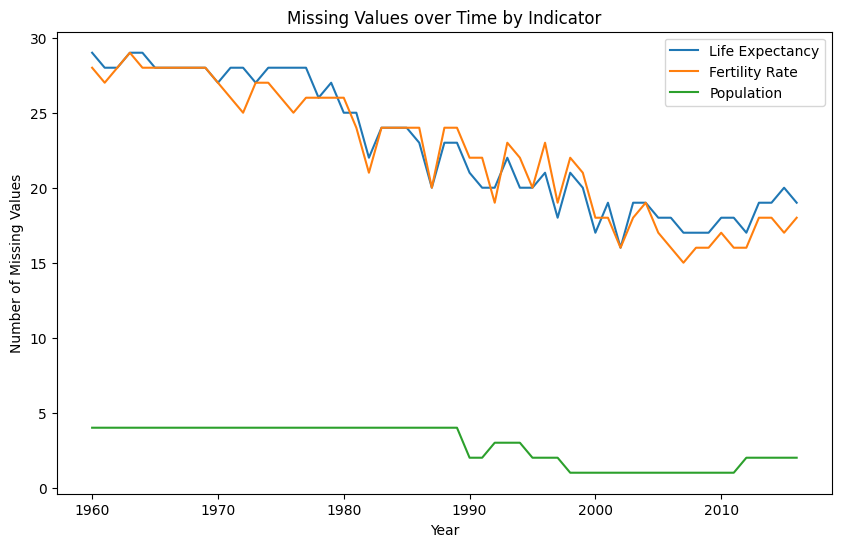

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
for ind in df_all["Indicator"].unique():
    subset = missing_by_year[missing_by_year["Indicator"] == ind]
    plt.plot(subset["Year"], subset["Missing_Count"], label=ind)

plt.xlabel("Year")
plt.ylabel("Number of Missing Values")
plt.title("Missing Values over Time by Indicator")
plt.legend()
plt.show()

In [11]:
# STEP 4A: Pivot the long df_all back into columns by indicator
df_pivot = df_all.pivot_table(
    index=["Country Name", "Country Code", "Year"],
    columns="Indicator",
    values="Value"
).reset_index()

df_pivot.head()

Indicator,Country Name,Country Code,Year,Fertility Rate,Life Expectancy,Population
0,Afghanistan,AFG,1960,7.45,32.292,8996351.0
1,Afghanistan,AFG,1961,7.45,32.742,9166764.0
2,Afghanistan,AFG,1962,7.45,33.185,9345868.0
3,Afghanistan,AFG,1963,7.45,33.624,9533954.0
4,Afghanistan,AFG,1964,7.45,34.060,9731361.0


In [13]:
# STEP 4B (fixed): Merge using only "Country Code"
df_final = df_pivot.merge(
    df_meta,
    on="Country Code",
    how="left"
)

print("Final merged dataset shape:", df_final.shape)
df_final.head()

Final merged dataset shape: (14897, 11)


,Country Name,Country Code,Year,Fertility Rate,Life Expectancy,Population,Region,IncomeGroup,SpecialNotes,TableName,Unnamed: 5
0,Afghanistan,AFG,1960,7.45,32.292,8996351.0,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
1,Afghanistan,AFG,1961,7.45,32.742,9166764.0,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
2,Afghanistan,AFG,1962,7.45,33.185,9345868.0,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
3,Afghanistan,AFG,1963,7.45,33.624,9533954.0,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
4,Afghanistan,AFG,1964,7.45,34.060,9731361.0,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN


In [14]:
print(df_final.columns)

# Check how many rows have region info
print(df_final["Region"].value_counts(dropna=False).head(10))

Index(['Country Name', 'Country Code', 'Year', 'Fertility Rate',
       'Life Expectancy', 'Population', 'Region', 'IncomeGroup',
       'SpecialNotes', 'TableName', 'Unnamed: 5'],
      dtype='object')
Region
Europe & Central Asia         3279
Sub-Saharan Africa            2736
NaN                           2622
Latin America & Caribbean     2357
East Asia & Pacific           2109
Middle East & North Africa    1167
South Asia                     456
North America                  171
Name: count, dtype: int64


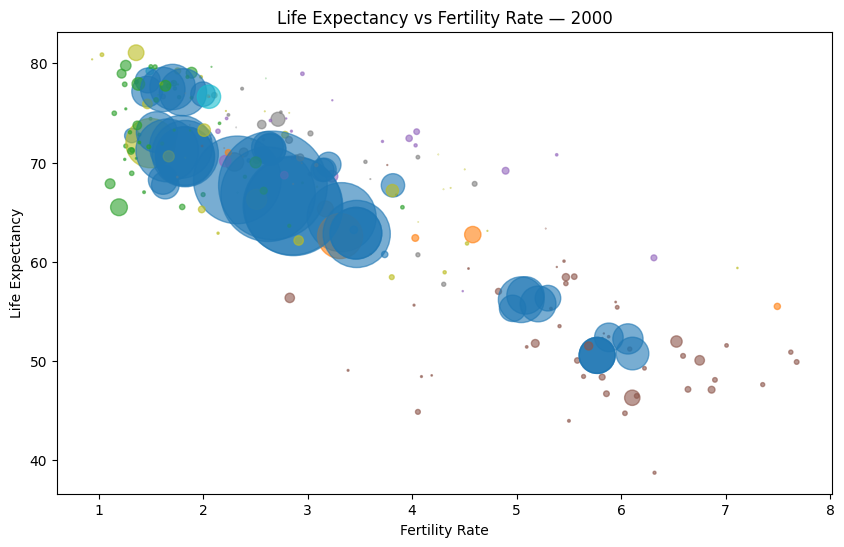

In [15]:
import matplotlib.pyplot as plt

# Pick a year for snapshot
year_to_plot = 2000

df_year = df_final[df_final["Year"] == year_to_plot].dropna(subset=["Life Expectancy", "Fertility Rate", "Population"])

plt.figure(figsize=(10,6))
scatter = plt.scatter(
    x=df_year["Fertility Rate"],
    y=df_year["Life Expectancy"],
    s=df_year["Population"] / 1e6,   # scale down size
    c=pd.factorize(df_year["Region"])[0], # color by region
    alpha=0.6,
    cmap="tab10"
)

plt.xlabel("Fertility Rate")
plt.ylabel("Life Expectancy")
plt.title(f"Life Expectancy vs Fertility Rate — {year_to_plot}")
plt.show()

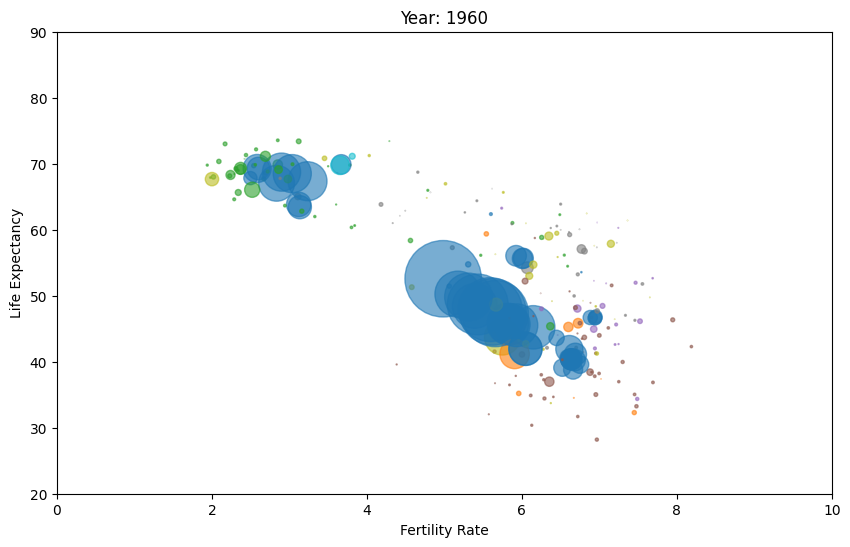

In [18]:
from matplotlib.animation import FuncAnimation
import numpy as np

# Get sorted years
years = sorted(df_final["Year"].unique())

# Prepare figure
fig, ax = plt.subplots(figsize=(10,6))

def update(year):
    ax.clear()
    subset = df_final[df_final["Year"] == year].dropna(
        subset=["Life Expectancy", "Fertility Rate", "Population"]
    )
    scatter = ax.scatter(
        subset["Fertility Rate"],
        subset["Life Expectancy"],
        s=subset["Population"]/1e6,
        c=pd.factorize(subset["Region"])[0],
        alpha=0.6,
        cmap="tab10"
    )
    ax.set_xlim(0, 10)   # fertility rate range
    ax.set_ylim(20, 90)  # life expectancy range
    ax.set_xlabel("Fertility Rate")
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Year: {year}")
    return scatter,

# IMPORTANT: assign ani to a variable that persists
ani = FuncAnimation(fig, update, frames=years, interval=500, repeat=False)

In [19]:
from IPython.display import HTML
HTML(ani.to_jshtml())

In [20]:
# Save as MP4 (requires ffmpeg, which Colab has)
ani.save("rosling_animation.mp4", writer="ffmpeg", dpi=150)

# Save as GIF (requires imagemagick)
# ani.save("rosling_animation.gif", writer="imagemagick", dpi=100)

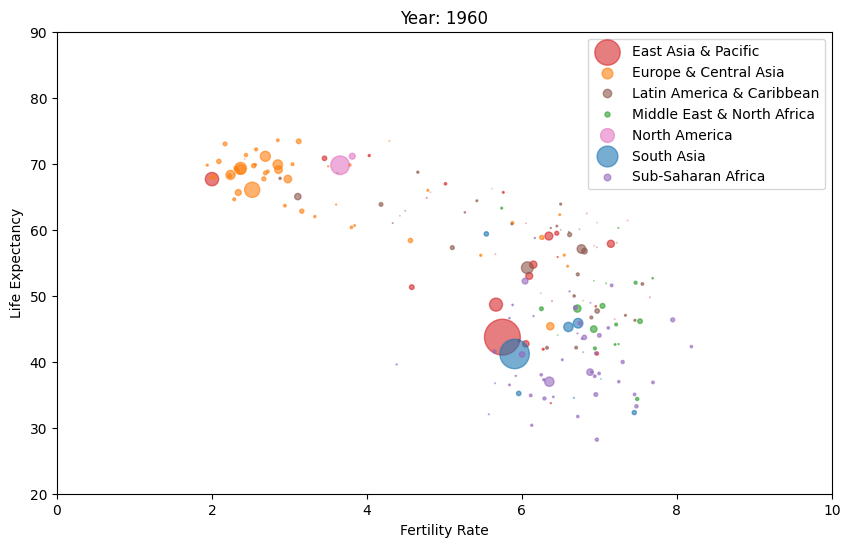

In [22]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np

# Define a consistent color map for regions
regions = df_final["Region"].dropna().unique()
region_to_color = {region: color for region, color in zip(regions, plt.cm.tab10.colors)}

# Get sorted years
years = sorted(df_final["Year"].unique())

# Prepare figure
fig, ax = plt.subplots(figsize=(10,6))

def update(year):
    ax.clear()
    subset = df_final[df_final["Year"] == year].dropna(
        subset=["Life Expectancy", "Fertility Rate", "Population", "Region"]
    )

    # Scatter plot with consistent region colors
    for region, group in subset.groupby("Region"):
        ax.scatter(
            group["Fertility Rate"],
            group["Life Expectancy"],
            s=group["Population"]/1e6,
            c=[region_to_color.get(region, "grey")],
            alpha=0.6,
            label=region
        )

    ax.set_xlim(0, 10)
    ax.set_ylim(20, 90)
    ax.set_xlabel("Fertility Rate")
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Year: {year}")

    # Add legend (only unique entries)
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc="upper right")

    return ax,

ani = FuncAnimation(fig, update, frames=years, interval=500, repeat=False)


In [23]:
from IPython.display import HTML
HTML(ani.to_jshtml())